In [1]:
import os
# os.environ["CUDA_VISIBLE_DEVICES"] = "0,1,2,3"
from diffusers import UNet2DConditionModel, DDPMScheduler
import torch
from torch.optim import AdamW
from dataset import ADNIDatasetSlicesInOrder
from torch.utils.data import DataLoader
from utils import load_trained_model, plot_batch_slices, normalise_intensity_per_slice
import numpy as np
import matplotlib.pyplot as plt

/cim/ehoney/ecse626proj/venv/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
device = torch.device("cuda:1" if torch.cuda.is_available() else "cpu")

In [3]:
batch_size = 4

## Experiment 5 or 6... or anything

In [ ]:
num_train_timesteps = 256
experiment_num = 6
slices_at_once = 4
symmetric_normalisation = False

In [5]:
model = UNet2DConditionModel(
    sample_size=128,
    in_channels=2*slices_at_once, #16
    out_channels=slices_at_once, #8 #initialise to maximum and compute loss only for indexed slices
    down_block_types=("DownBlock2D", "DownBlock2D", "DownBlock2D", "DownBlock2D", "AttnDownBlock2D"),
    mid_block_type=None,
    up_block_types=("AttnUpBlock2D", "UpBlock2D", "UpBlock2D", "UpBlock2D", "UpBlock2D"),
    # not sure about what the lower arguments do
    block_out_channels=(64, 128, 256, 512, 1024), #start with 64? no deeper than 1024
    layers_per_block=2, #default
    # cross_attention_dim=256, # ~concat one-hot encodings of condition and target slices~ NO now instead just one 128 vector with labels 0,1,2
    attention_head_dim=8, #default
    norm_num_groups=32, #default
    use_linear_projection=True #DIFFERENT
)

In [6]:
model.to(device)

UNet2DConditionModel(
  (conv_in): Conv2d(8, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (time_proj): Timesteps()
  (time_embedding): TimestepEmbedding(
    (linear_1): Linear(in_features=64, out_features=256, bias=True)
    (act): SiLU()
    (linear_2): Linear(in_features=256, out_features=256, bias=True)
  )
  (down_blocks): ModuleList(
    (0): DownBlock2D(
      (resnets): ModuleList(
        (0-1): 2 x ResnetBlock2D(
          (norm1): GroupNorm(32, 64, eps=1e-05, affine=True)
          (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (time_emb_proj): Linear(in_features=256, out_features=64, bias=True)
          (norm2): GroupNorm(32, 64, eps=1e-05, affine=True)
          (dropout): Dropout(p=0.0, inplace=False)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (nonlinearity): SiLU()
        )
      )
      (downsamplers): ModuleList(
        (0): Downsample2D(
          (conv): Conv2d(64

In [7]:
noise_scheduler = DDPMScheduler(num_train_timesteps=num_train_timesteps)

In [8]:
load_trained_model(model, f'experiment{experiment_num}/latest_ckpt.pth.tar')

/cim/ehoney/ecse626proj/utils.py:102: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(ckpt_path)


Checkpoint loaded from epoch 1500.


In [9]:
noised_target_slices = torch.randn(batch_size, slices_at_once, 128, 128, device=device)

In [10]:
condition_slices = torch.zeros_like(noised_target_slices)

In [11]:
target_slices = noised_target_slices

# for t in noise_scheduler.timesteps.flip(0):
for t in noise_scheduler.timesteps:
    print(f't is {t}')
    timesteps = torch.tensor([t], device=device, dtype=torch.float32).repeat(batch_size)

    input_tensor = torch.concat((target_slices, condition_slices), dim=1)

    with torch.no_grad():
        predicted_noise = model(input_tensor, timesteps, None).sample

    target_slices = noise_scheduler.step(predicted_noise, t, target_slices).prev_sample

t is 255
t is 254
t is 253
t is 252
t is 251
t is 250
t is 249
t is 248
t is 247
t is 246
t is 245
t is 244
t is 243
t is 242
t is 241
t is 240
t is 239
t is 238
t is 237
t is 236
t is 235
t is 234
t is 233
t is 232
t is 231
t is 230
t is 229
t is 228
t is 227
t is 226
t is 225
t is 224
t is 223
t is 222
t is 221
t is 220
t is 219
t is 218
t is 217
t is 216
t is 215
t is 214
t is 213
t is 212
t is 211
t is 210
t is 209
t is 208
t is 207
t is 206
t is 205
t is 204
t is 203
t is 202
t is 201
t is 200
t is 199
t is 198
t is 197
t is 196
t is 195
t is 194
t is 193
t is 192
t is 191
t is 190
t is 189
t is 188
t is 187
t is 186
t is 185
t is 184
t is 183
t is 182
t is 181
t is 180
t is 179
t is 178
t is 177
t is 176
t is 175
t is 174
t is 173
t is 172
t is 171
t is 170
t is 169
t is 168
t is 167
t is 166
t is 165
t is 164
t is 163
t is 162
t is 161
t is 160
t is 159
t is 158
t is 157
t is 156
t is 155
t is 154
t is 153
t is 152
t is 151
t is 150
t is 149
t is 148
t is 147
t is 146
t is 145
t

In [12]:
predicted_noise.shape

torch.Size([4, 4, 128, 128])

/cim/ehoney/ecse626proj/utils.py:134: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])  # Leave space for the colorbar


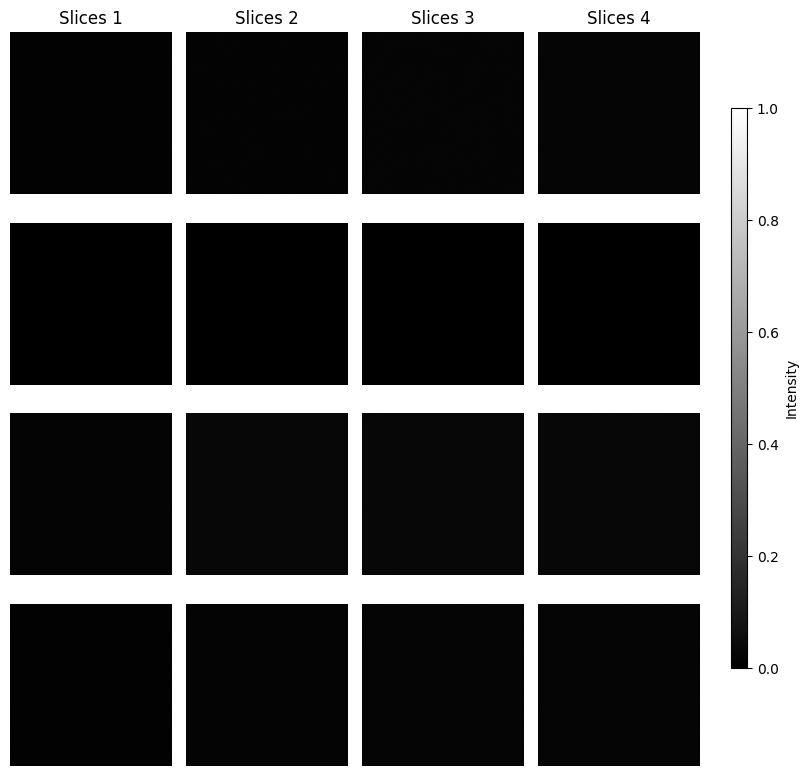

In [13]:
plot_batch_slices(target_slices, batch_size=batch_size, slices=slices_at_once)

### Giving condition slices

In [44]:
noised_target_slices = torch.randn(batch_size, slices_at_once, 128, 128, device=device)

In [45]:
data_dir = "/cim/ehoney/ecse626proj/preprocessed_data"
train_dataset = ADNIDatasetSlicesInOrder(data_dir, sample_full_brain=True)
train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=8) # CHANGE to NUM_WORKERS=4

In [46]:
one_batch = next(iter(train_dataloader))

In [47]:
start_index = 0

In [48]:
condition_slices = one_batch[:, start_index:start_index+slices_at_once].float().to(device)

In [49]:
def sample_next_slices(noise_scheduler, noised_target_slices, condition_slices, verbose=False):

    target_slices = noised_target_slices

    # for t in noise_scheduler.timesteps.flip(0):
    for t in noise_scheduler.timesteps:
        if verbose:
            print(f't is {t}')
        timesteps = torch.tensor([t], device=device, dtype=torch.float32).repeat(batch_size)

        input_tensor = torch.concat((target_slices, condition_slices), dim=1)

        with torch.no_grad():
            predicted_noise = model(input_tensor, timesteps, None).sample

        target_slices = noise_scheduler.step(predicted_noise, t, target_slices).prev_sample

    return target_slices

In [50]:
target_slices = sample_next_slices(noise_scheduler, noised_target_slices, condition_slices)

In [53]:
target_slices = normalise_intensity_per_slice(target_slices.cpu()).to(device)

/cim/ehoney/ecse626proj/utils.py:134: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])  # Leave space for the colorbar


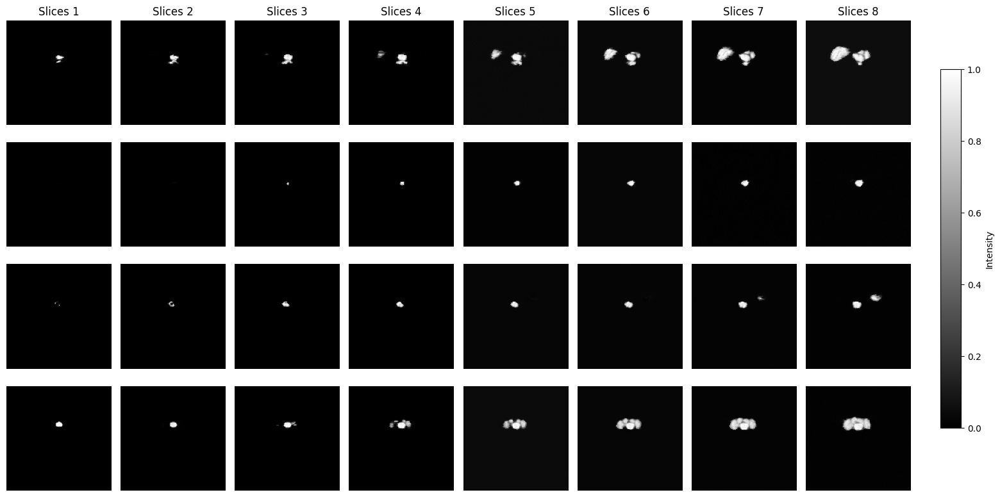

In [54]:
plot_batch_slices(torch.concat((condition_slices, target_slices), dim=1), batch_size=batch_size, slices=2*slices_at_once)

### Trying sampling iteratively

Give it `slices_at_once` number of real brain MRI slices as condition slices, from a particular starting point

#### `condition_start_index = 0`

In [55]:
condition_start_index = 0
target_start_index = condition_start_index + slices_at_once

In [56]:
condition_slices = one_batch[:, condition_start_index:target_start_index].float().to(device)

In [57]:
output_batch = torch.zeros(batch_size, 128, 128, 128)

In [58]:
output_batch[:, condition_start_index:target_start_index] = condition_slices
print(f'Condition slices populated from slice {condition_start_index} to {target_start_index}')

Condition slices populated from slice 0 to 4


In [59]:
target_slices

tensor([[[[0.0389, 0.0392, 0.0378,  ..., 0.0388, 0.0396, 0.0367],
          [0.0377, 0.0391, 0.0390,  ..., 0.0383, 0.0391, 0.0383],
          [0.0388, 0.0387, 0.0398,  ..., 0.0387, 0.0400, 0.0400],
          ...,
          [0.0380, 0.0383, 0.0390,  ..., 0.0385, 0.0396, 0.0399],
          [0.0385, 0.0390, 0.0396,  ..., 0.0401, 0.0393, 0.0394],
          [0.0398, 0.0390, 0.0402,  ..., 0.0394, 0.0400, 0.0370]],

         [[0.0343, 0.0348, 0.0339,  ..., 0.0351, 0.0341, 0.0313],
          [0.0341, 0.0316, 0.0330,  ..., 0.0327, 0.0327, 0.0334],
          [0.0336, 0.0344, 0.0333,  ..., 0.0342, 0.0339, 0.0341],
          ...,
          [0.0345, 0.0331, 0.0329,  ..., 0.0338, 0.0336, 0.0337],
          [0.0351, 0.0358, 0.0333,  ..., 0.0344, 0.0342, 0.0337],
          [0.0346, 0.0326, 0.0326,  ..., 0.0337, 0.0325, 0.0338]],

         [[0.0207, 0.0197, 0.0177,  ..., 0.0196, 0.0182, 0.0172],
          [0.0181, 0.0179, 0.0171,  ..., 0.0180, 0.0195, 0.0193],
          [0.0196, 0.0174, 0.0173,  ..., 0

In [61]:
for i in range(target_start_index, 128, slices_at_once):
    print(f'Sampling slices {i} to {i+slices_at_once}...')
    noised_target_slices = torch.randn(batch_size, slices_at_once, 128, 128, device=device)
    
    target_slices = sample_next_slices(noise_scheduler, noised_target_slices, condition_slices)
    # target_slices = normalise_intensity_per_slice(target_slices.cpu()).to(device)
    print(target_slices.min(), target_slices.max())

    output_batch[:, i:i+slices_at_once] = target_slices

    print(f'Complete.')

    condition_slices = target_slices.float()
    

Sampling slices 4 to 8...
tensor(-0.0573, device='cuda:1') tensor(1., device='cuda:1')
Complete.
Sampling slices 8 to 12...
tensor(-0.0499, device='cuda:1') tensor(1., device='cuda:1')
Complete.
Sampling slices 12 to 16...
tensor(-0.0519, device='cuda:1') tensor(1., device='cuda:1')
Complete.
Sampling slices 16 to 20...
tensor(-0.0813, device='cuda:1') tensor(0.9901, device='cuda:1')
Complete.
Sampling slices 20 to 24...
tensor(-0.0705, device='cuda:1') tensor(1., device='cuda:1')
Complete.
Sampling slices 24 to 28...
tensor(-0.1028, device='cuda:1') tensor(1., device='cuda:1')
Complete.
Sampling slices 28 to 32...
tensor(-0.1139, device='cuda:1') tensor(1., device='cuda:1')
Complete.
Sampling slices 32 to 36...
tensor(-0.1178, device='cuda:1') tensor(1., device='cuda:1')
Complete.
Sampling slices 36 to 40...
tensor(-0.1406, device='cuda:1') tensor(1., device='cuda:1')
Complete.
Sampling slices 40 to 44...
tensor(-0.1327, device='cuda:1') tensor(1., device='cuda:1')
Complete.
Sampling 

/cim/ehoney/ecse626proj/utils.py:134: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])  # Leave space for the colorbar


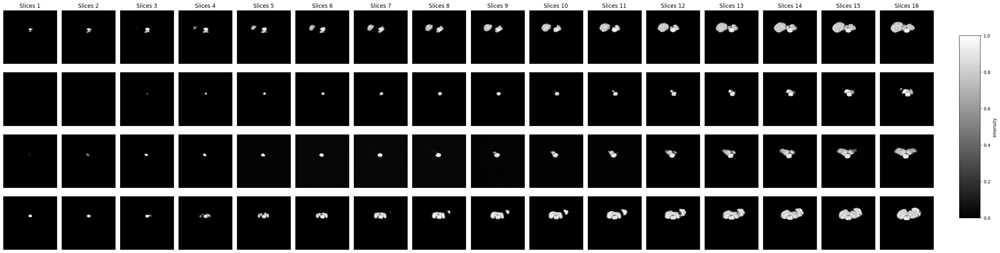

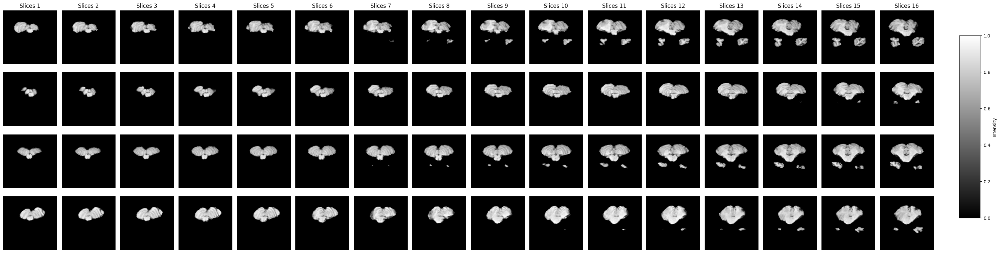

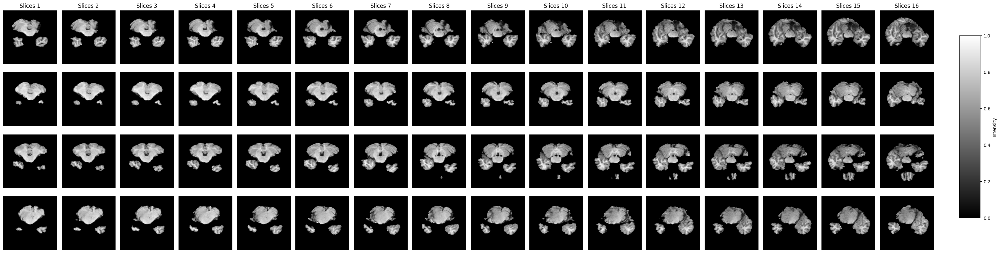

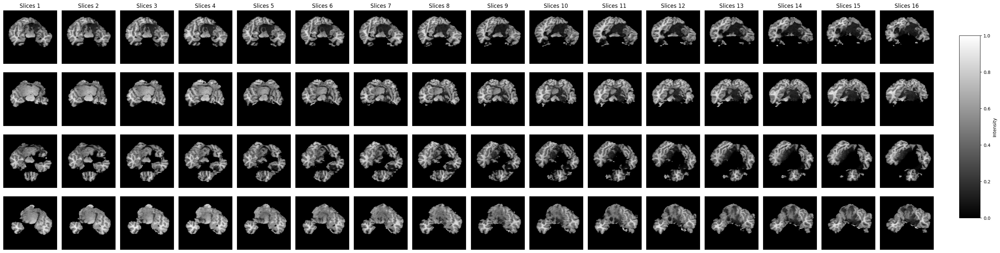

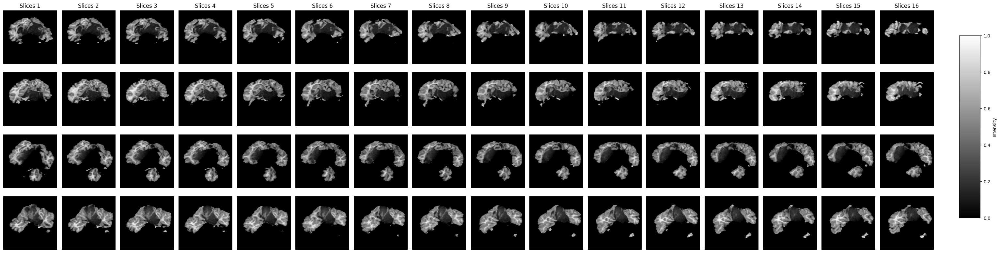

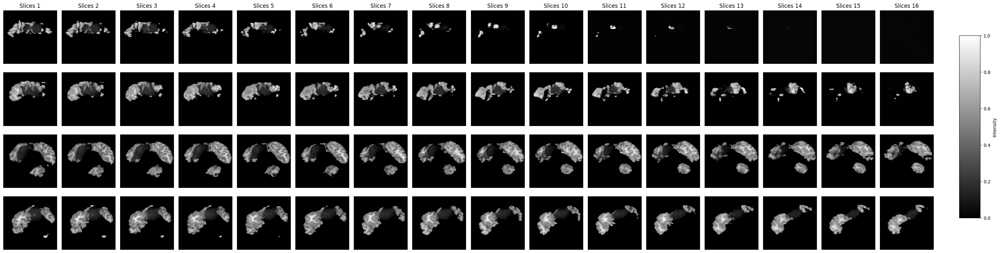

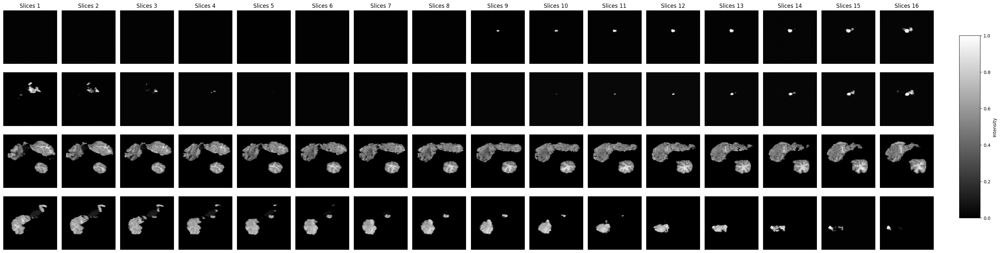

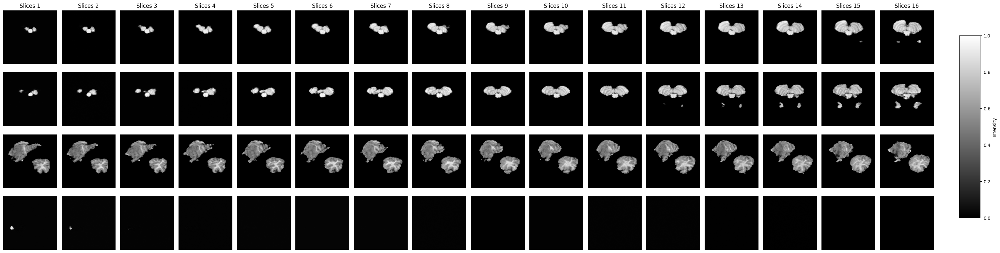

In [62]:
for i in range(0, 128, 16):
    save_path = f'cond_start={condition_start_index}_{i}.png'
    plot_batch_slices(output_batch[:, i:i+16], batch_size=batch_size, slices=16, save_path=save_path)

#### `condition_start_index = 8`

In [63]:
condition_start_index = 8
target_start_index = condition_start_index + slices_at_once

In [64]:
condition_slices = one_batch[:, condition_start_index:target_start_index].float().to(device)

In [65]:
output_batch = torch.zeros(batch_size, 128, 128, 128)

In [66]:
output_batch[:, condition_start_index:target_start_index] = condition_slices
print(f'Condition slices populated from slice {condition_start_index} to {target_start_index}')

Condition slices populated from slice 8 to 12


In [67]:
for i in range(target_start_index, 128, slices_at_once):
    print(f'Sampling slices {i} to {i+slices_at_once}...')
    noised_target_slices = torch.randn(batch_size, slices_at_once, 128, 128, device=device)
    
    target_slices = sample_next_slices(noise_scheduler, noised_target_slices, condition_slices)
    target_slices = normalise_intensity_per_slice(target_slices.cpu()).to(device)

    output_batch[:, i:i+slices_at_once] = target_slices

    print(f'Complete.')

    condition_slices = target_slices.float()
    

Sampling slices 12 to 16...
Complete.
Sampling slices 16 to 20...
Complete.
Sampling slices 20 to 24...
Complete.
Sampling slices 24 to 28...
Complete.
Sampling slices 28 to 32...
Complete.
Sampling slices 32 to 36...
Complete.
Sampling slices 36 to 40...
Complete.
Sampling slices 40 to 44...
Complete.
Sampling slices 44 to 48...
Complete.
Sampling slices 48 to 52...
Complete.
Sampling slices 52 to 56...
Complete.
Sampling slices 56 to 60...
Complete.
Sampling slices 60 to 64...
Complete.
Sampling slices 64 to 68...
Complete.
Sampling slices 68 to 72...
Complete.
Sampling slices 72 to 76...
Complete.
Sampling slices 76 to 80...
Complete.
Sampling slices 80 to 84...
Complete.
Sampling slices 84 to 88...
Complete.
Sampling slices 88 to 92...
Complete.
Sampling slices 92 to 96...
Complete.
Sampling slices 96 to 100...
Complete.
Sampling slices 100 to 104...
Complete.
Sampling slices 104 to 108...
Complete.
Sampling slices 108 to 112...
Complete.
Sampling slices 112 to 116...
Complete.
Sam

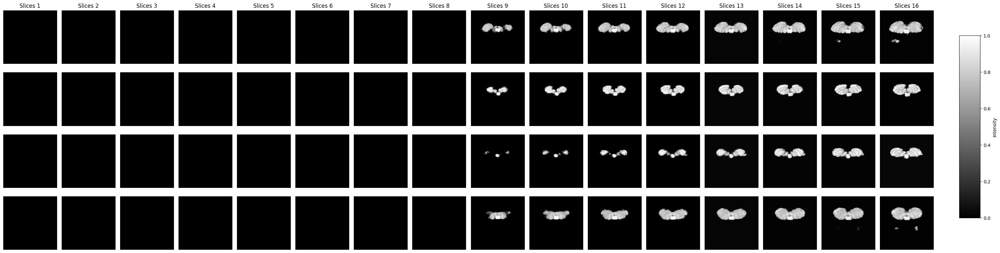

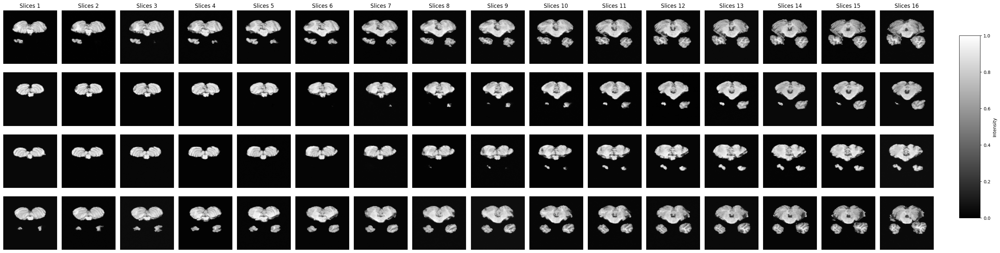

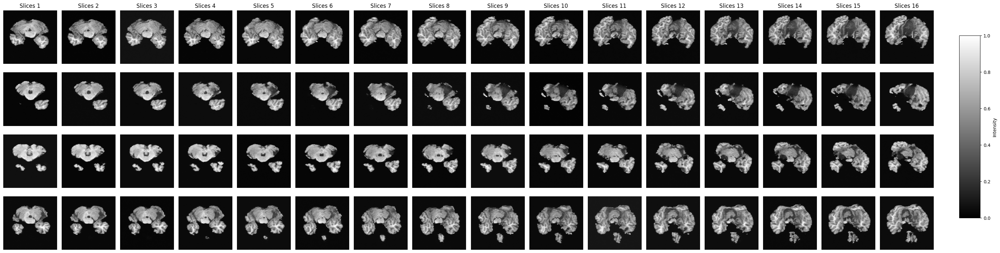

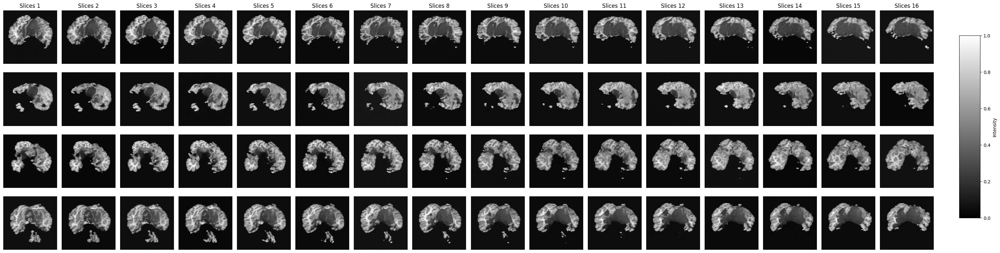

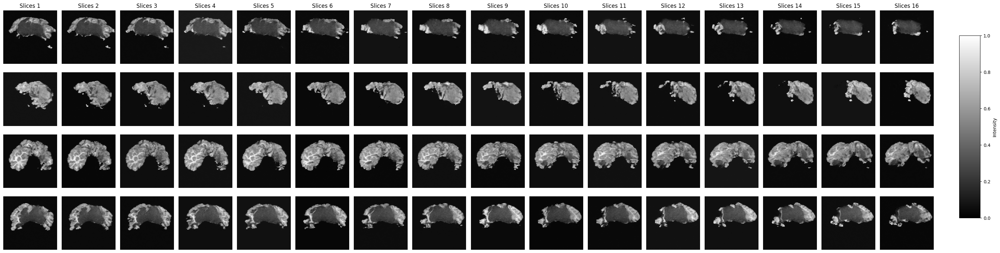

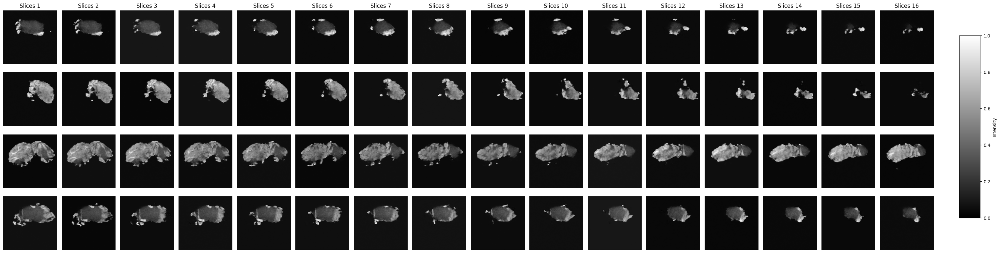

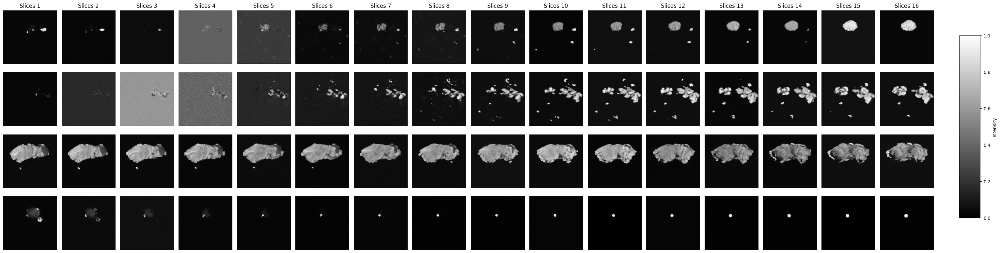

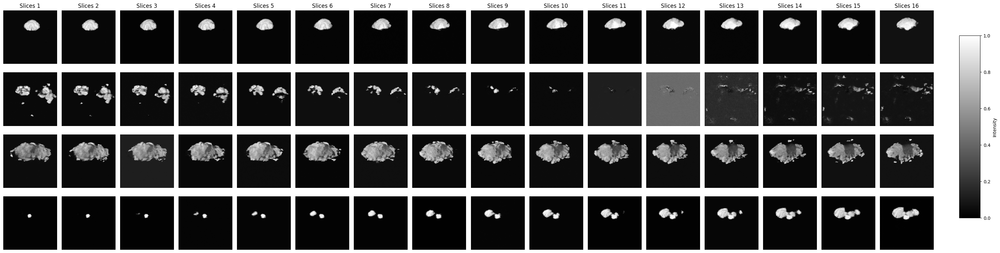

In [68]:
for i in range(0, 128, 16):
    save_path = os.path.join('/cim/ehoney/ecse626proj/experiment6/epoch1500',f'cond_start={condition_start_index}_{i}.png')
    plot_batch_slices(output_batch[:, i:i+16], batch_size=batch_size, slices=16, save_path=save_path)

#### `condition_start_index` = 60

In [69]:
condition_start_index = 60
target_start_index = condition_start_index + slices_at_once

In [70]:
condition_slices = one_batch[:, condition_start_index:target_start_index].float().to(device)

In [71]:
output_batch = torch.zeros(batch_size, 128, 128, 128)

In [72]:
output_batch[:, condition_start_index:target_start_index] = condition_slices
print(f'Condition slices populated from slice {condition_start_index} to {target_start_index}')

Condition slices populated from slice 60 to 64


In [73]:
for i in range(target_start_index, 128, slices_at_once):
    print(f'Sampling slices {i} to {i+slices_at_once}...')
    noised_target_slices = torch.randn(batch_size, slices_at_once, 128, 128, device=device)
    
    target_slices = sample_next_slices(noise_scheduler, noised_target_slices, condition_slices)
    target_slices = normalise_intensity_per_slice(target_slices.cpu()).to(device)

    output_batch[:, i:i+slices_at_once] = target_slices

    print(f'Complete.')

    condition_slices = target_slices.float()
    

Sampling slices 64 to 68...
Complete.
Sampling slices 68 to 72...
Complete.
Sampling slices 72 to 76...
Complete.
Sampling slices 76 to 80...
Complete.
Sampling slices 80 to 84...
Complete.
Sampling slices 84 to 88...
Complete.
Sampling slices 88 to 92...
Complete.
Sampling slices 92 to 96...
Complete.
Sampling slices 96 to 100...
Complete.
Sampling slices 100 to 104...
Complete.
Sampling slices 104 to 108...
Complete.
Sampling slices 108 to 112...
Complete.
Sampling slices 112 to 116...
Complete.
Sampling slices 116 to 120...
Complete.
Sampling slices 120 to 124...
Complete.
Sampling slices 124 to 128...
Complete.


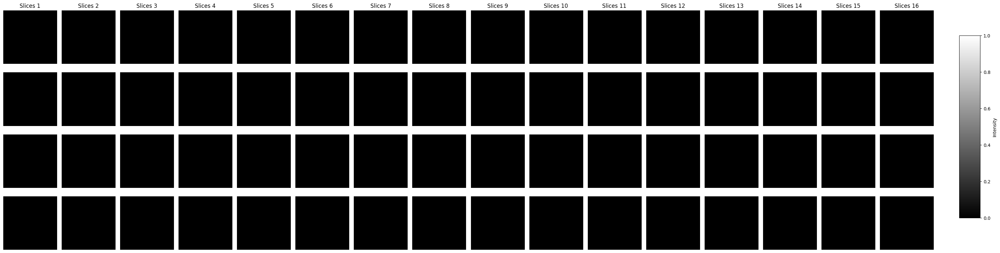

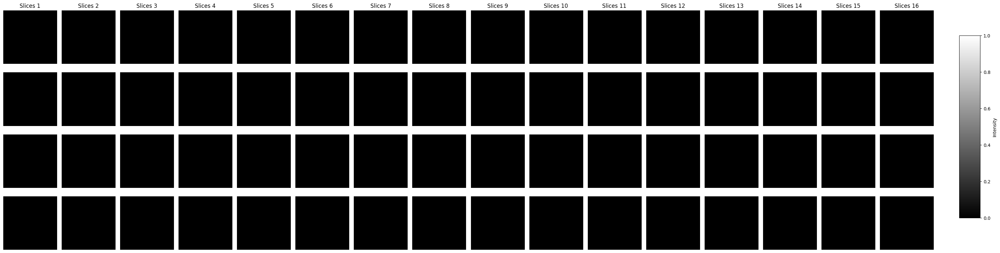

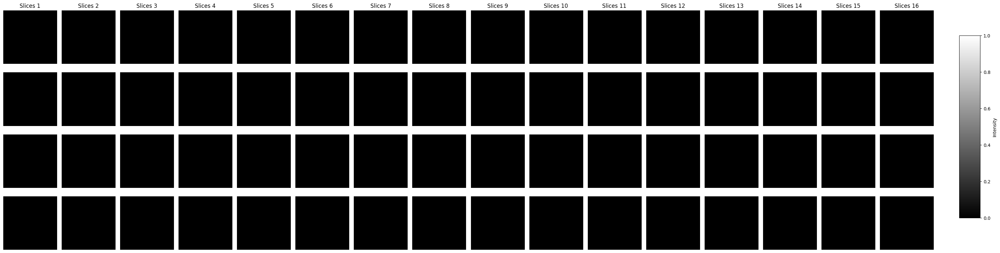

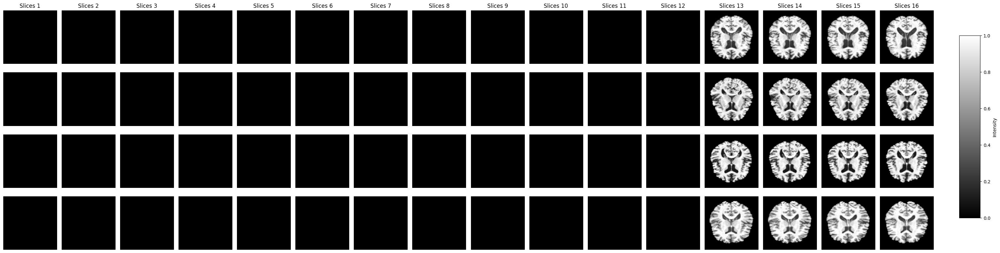

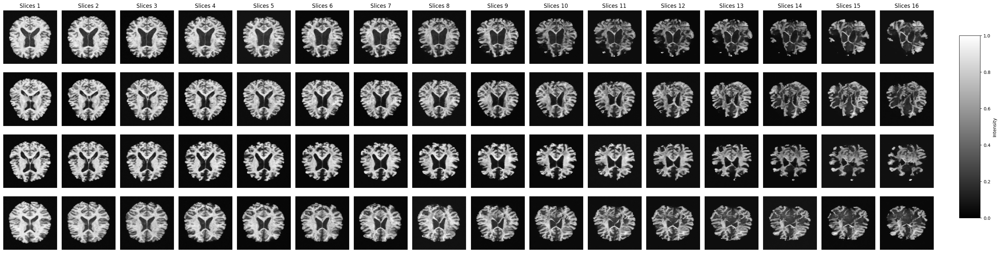

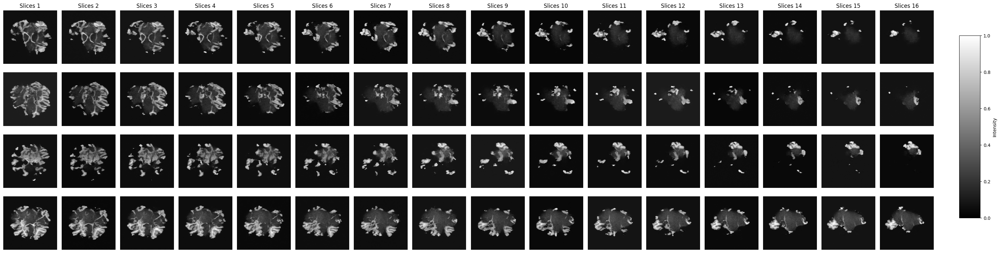

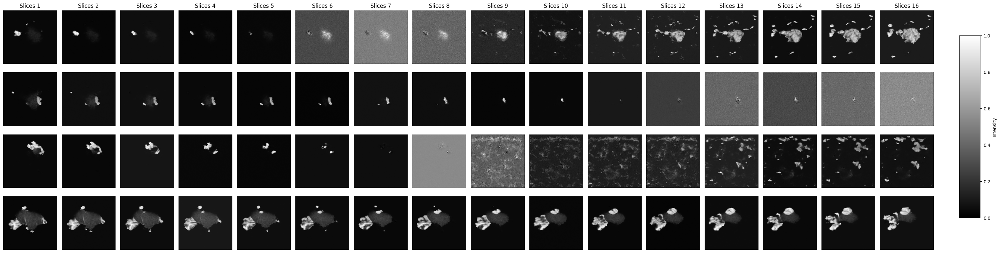

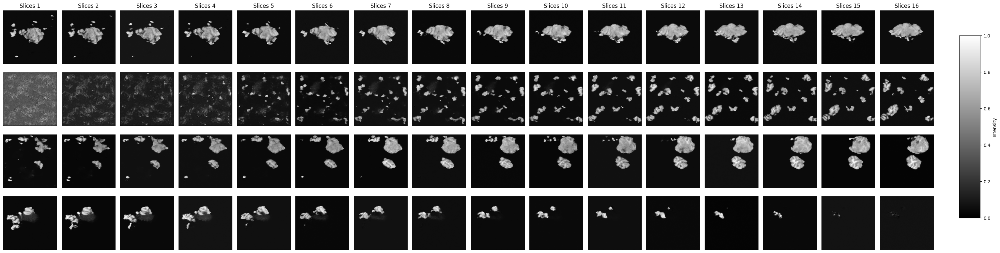

In [74]:
for i in range(0, 128, 16):
    save_path = os.path.join('/cim/ehoney/ecse626proj/experiment6/epoch1500',f'cond_start={condition_start_index}_{i}.png')
    plot_batch_slices(output_batch[:, i:i+16], batch_size=batch_size, slices=16, save_path=save_path)